## EDA

In [1]:
# Import libraries
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt


### Describe dataset

In [2]:
# read data
df_raw = pd.read_csv('http://huy302.github.io/interview_dataset.csv')
df_raw.head()

,treatment company,azimuth,md (ft),tvd (ft),date on production,operator,footage lateral length,well spacing,porpoise deviation,porpoise count,...,p-velocity,s-velocity,youngs modulus,isip,breakdown pressure,pump rate,total number of stages,proppant volume,proppant fluid ratio,production
0,treatment company 1,-32.279999,19148,6443.0,3/1/2018,operator 1,11966.0,4368.46290,6.33,12,...,13592.23,6950.44,30.82,4149.0,NaN,83,56,21568792.0,1.23,5614.947951
1,treatment company 2,-19.799999,15150,7602.0,7/1/2014,operator 2,6890.0,4714.99220,1.28,4,...,11735.04,7162.45,29.72,5776.0,NaN,102,33,9841307.0,1.47,2188.836707
2,treatment company 3,-26.879999,14950,5907.0,8/1/2018,operator 1,8793.0,798.92096,2.03,6,...,13227.81,6976.93,30.99,4628.0,NaN,88,62,17116240.0,1.67,1450.033022
3,treatment company 4,-49.099998,11098,6538.0,1/1/2012,operator 1,4234.0,NaN,6.00,23,...,12646.34,6799.37,26.20,4582.0,NaN,100,11,3749559.0,0.77,1060.764407
4,treatment company 5,5.560000,10549,7024.0,1/1/2012,operator 3,2972.0,2967.56300,11.87,9,...,13192.18,7046.91,31.18,4909.0,NaN,94,9,6690705.0,1.32,607.530385


In [3]:
# What's the shape of the dataset?
df_raw.shape

(1000, 28)

In [4]:
# What's the types of our columns?
df_raw.dtypes

treatment company          object
azimuth                   float64
md (ft)                     int64
tvd (ft)                  float64
date on production         object
operator                   object
footage lateral length    float64
well spacing              float64
porpoise deviation        float64
porpoise count              int64
shale footage               int64
acoustic impedance        float64
log permeability          float64
porosity                  float64
poisson ratio             float64
water saturation          float64
toc                       float64
vcl                       float64
p-velocity                float64
s-velocity                float64
youngs modulus            float64
isip                      float64
breakdown pressure        float64
pump rate                   int64
total number of stages      int64
proppant volume           float64
proppant fluid ratio      float64
production                float64
dtype: object

In [5]:
# Set *date on production* column to datetime type in format "year-month-day"
df_raw['date on production'] = pd.to_datetime(df_raw['date on production'], format='%m/%d/%Y')

In [6]:
# Now let's describe the numeric columns in our dataset
df_raw.describe(include=['float64', 'int64']).T

,count,mean,std,min,25%,50%,75%,max
azimuth,945.0,-3.390574e+01,1.797566e+01,-87.250000,-4.622000e+01,-3.299000e+01,-2.258000e+01,2.294000e+01
md (ft),1000.0,1.398839e+04,2.584316e+03,8642.000000,1.215750e+04,1.365950e+04,1.546800e+04,2.779700e+04
tvd (ft),980.0,7.103620e+03,8.969473e+02,4859.000000,6.407000e+03,6.977000e+03,7.820000e+03,9.639000e+03
footage lateral length,1000.0,6.387050e+03,2.520330e+03,1329.000000,4.668000e+03,5.927000e+03,7.744000e+03,1.984900e+04
well spacing,844.0,2.223227e+03,1.255063e+03,335.458620,1.084525e+03,1.999295e+03,3.090201e+03,5.225089e+03
porpoise deviation,1000.0,5.045709e+01,1.184367e+02,0.030000,4.660000e+00,1.088000e+01,3.053750e+01,1.106130e+03
porpoise count,1000.0,9.443000e+00,6.882596e+00,0.000000,4.000000e+00,8.000000e+00,1.300000e+01,3.900000e+01
shale footage,1000.0,3.784827e+03,3.703775e+03,0.000000,0.000000e+00,3.591500e+03,6.081750e+03,1.776300e+04
acoustic impedance,1000.0,3.349284e+04,2.074387e+03,26740.050000,3.271846e+04,3.459222e+04,3.481979e+04,3.805763e+04
log permeability,1000.0,6.235700e-01,3.927587e-01,-0.030000,3.100000e-01,5.200000e-01,8.700000e-01,1.940000e+00


### Missing values treatment

We can see that there many missing values in some columns as:
- water saturation
- breakdown pressure

Before discard those columns, let's see what's happen

In [7]:
# First water saturation
water_saturation = df_raw[df_raw['water saturation'] >= 0]
no_water_saturation = df_raw[df_raw['water saturation'].isna()]

How's the distribution of this variable?

<AxesSubplot: ylabel='Frequency'>

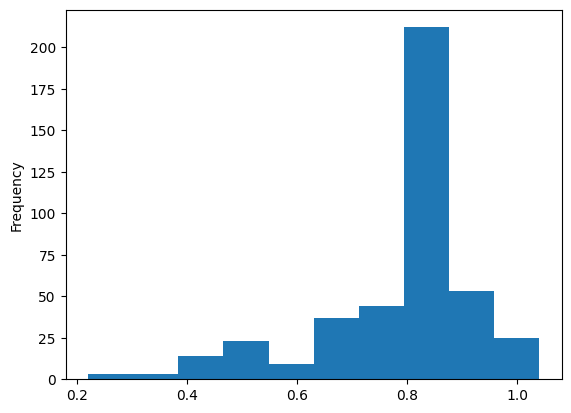

In [8]:
df_raw['water saturation'].plot(kind='hist')

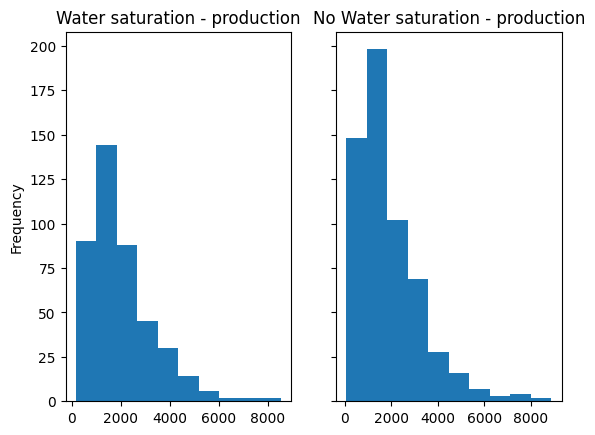

In [9]:
fig, axs = plt.subplots(1,2, sharey=True)
water_saturation['production'].plot(kind='hist', ax=axs[0], xlabel='Production', title='Water saturation - production')
no_water_saturation['production'].plot(kind='hist', ax=axs[1], xlabel='Production', title='No Water saturation - production')
plt.show()

The production between the dataset with water saturation and without it is not so different, let's see the mean production for each case

In [10]:
print(f'''
Mean production with water saturation {round(water_saturation['production'].mean(), 2)} +- {round(water_saturation['production'].std(), 2)}
Mean production without water saturation {round(no_water_saturation['production'].mean(), 2)} +- {round(no_water_saturation['production'].std(), 2)}
''')


Mean production with water saturation 2008.92 +- 1330.98
Mean production without water saturation 1906.67 +- 1365.85



There's a small difference in production between both datasets, what is the correlation between this value and the production?

In [11]:
from scipy.stats import pearsonr

pearsonr(water_saturation['water saturation'], water_saturation['production'])
# water_saturation.corr()

PearsonRResult(statistic=0.04995353089730459, pvalue=0.305366812548647)

Using Pearson correlation found that correlation is closer to zero and a significance value major than 0.1, this indicate a feature with low relevance, then we can drop this column.

Now analyze "breakdown preassure":

In [12]:
breakdown_pressure = df_raw[df_raw['breakdown pressure'] >= 0]
no_breakdown_pressure = df_raw[df_raw['breakdown pressure'].isna()]

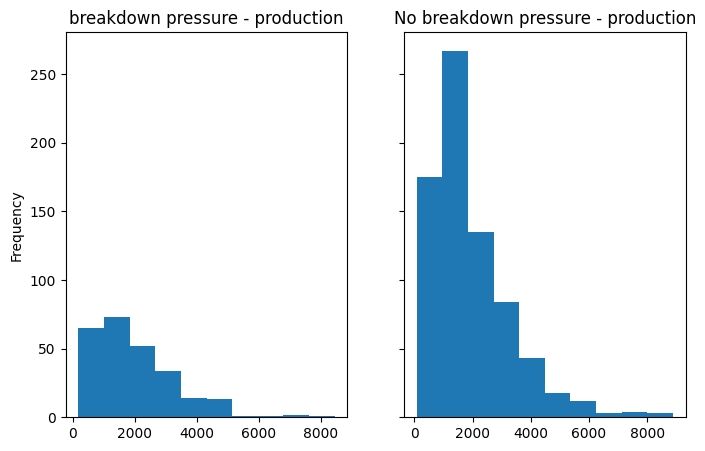

In [13]:
fig, axs = plt.subplots(1,2, figsize=(8, 5), sharey=True)
breakdown_pressure['production'].plot(kind='hist', ax=axs[0], xlabel='Production', title='breakdown pressure - production')
no_breakdown_pressure['production'].plot(kind='hist', ax=axs[1], xlabel='Production', title='No breakdown pressure - production')
plt.show()

In [14]:
print(f'''
Mean production with water saturation {round(breakdown_pressure['production'].mean(), 2)} +- {round(breakdown_pressure['production'].std(), 2)}
Mean production without water saturation {round(no_breakdown_pressure['production'].mean(), 2)} +- {round(no_breakdown_pressure['production'].std(), 2)}
''')


Mean production with water saturation 1995.74 +- 1339.54
Mean production without water saturation 1934.15 +- 1356.11



In [15]:
pearsonr(breakdown_pressure['breakdown pressure'], breakdown_pressure['production'])

PearsonRResult(statistic=0.016842089009004566, pvalue=0.788565622992267)

But... what about the other variables in the dataset, let's see for correlation between all columns with the production 

In [16]:
pcorr_dict = {}

for column in df_raw.columns:
    try:
        pcorr = pearsonr(df_raw[column], df_raw['production'], )
        pcorr_dict[column] = [pcorr[0], pcorr[1]]
    except:
        pass

df_corr = pd.DataFrame(pcorr_dict).T
df_corr.columns = ['statistic', 'pvalue']

In [17]:
df_corr.sort_values('pvalue', ascending=False)

,statistic,pvalue
porpoise count,0.006807,8.297745e-01
shale footage,0.019410,5.398162e-01
vcl,0.019636,5.351049e-01
acoustic impedance,-0.020910,5.089380e-01
log permeability,0.023388,4.600525e-01
porpoise deviation,-0.027703,3.815151e-01
proppant fluid ratio,0.129260,4.137836e-05
poisson ratio,-0.136917,1.394366e-05
pump rate,0.143837,4.956683e-06
s-velocity,-0.204953,6.043149e-11


Ok, we can see that the first five variables has values greater than 0.05 and 0.1 therefore have low correlation with the production,before take a final desition to drop columns, I'll change the columns 'water saturation' and 'breakdown pressure' to boolean type values

In [18]:
# I'll create a new dataframe to update processed values
df_processed = df_raw.copy()

In [19]:
df_processed['water saturation'] = df_processed['water saturation'].apply(lambda x: 1 if x >= 0 else 0)
df_processed['breakdown pressure'] = df_processed['breakdown pressure'].apply(lambda x: 1 if x >= 0 else 0)

I want to know if this values has relation with 'treatment company', maybe is a feature of machinery

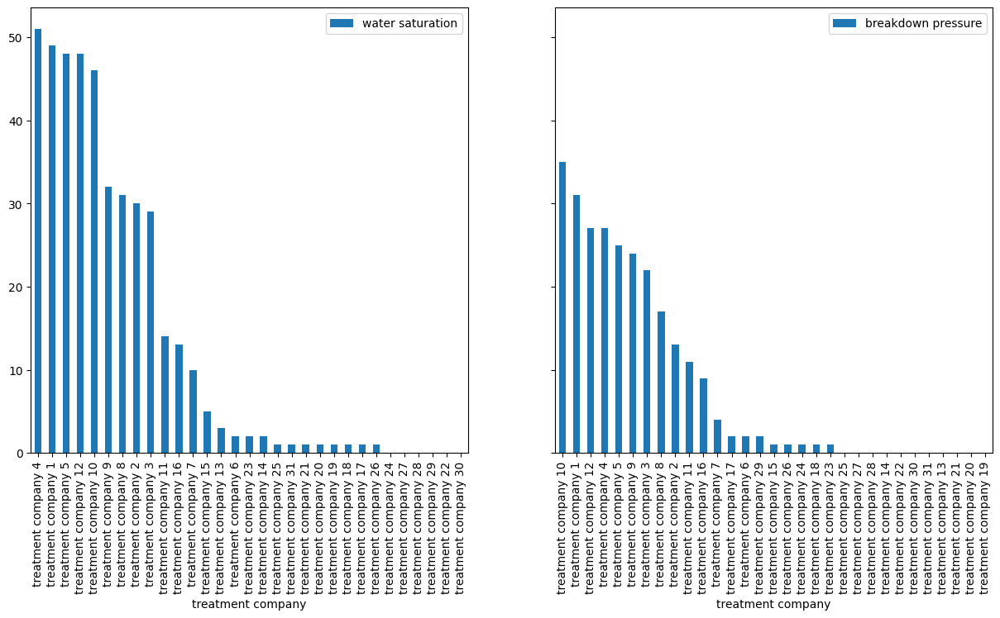

In [20]:
fig, axs = plt.subplots(1,2, figsize=(15, 7), sharey=True)
{
df_processed.groupby(['treatment company'])[['water saturation']].sum()
.sort_values(by='water saturation', ascending=False)
.plot(kind='bar', ax=axs[0])
}
{
df_processed.groupby(['treatment company'])[['breakdown pressure']].sum()
.sort_values(by='breakdown pressure', ascending=False)
.plot(kind='bar', ax=axs[1])
}
plt.show()

With this method we can see that in both projects there is some companies with a great amount of projects as the 1, 4, 5, 10 and 12, later we'll study the relation between companies and production.

Other variable with a large amount of missing values is 'well spacing', first let's look at the distribution of the data

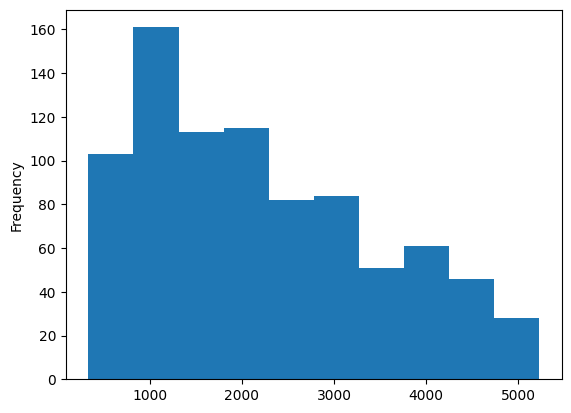

Mean: 2223.2271742891
std: 1255.0633410075789
Median: 1999.2952500000001


In [21]:
df_raw['well spacing'].plot(kind='hist')
plt.show()
print(f"Mean: {df_raw['well spacing'].mean()}\nstd: {df_raw['well spacing'].std()}\nMedian: {df_raw['well spacing'].median()}")

This column don't seem like normal distribution but the standard deviation is considerable, in this case impute missing values with the median

In [22]:
df_processed['well spacing'].fillna(df_processed['well spacing'].median(), inplace=True)

Now check the case of 'proppant volume'

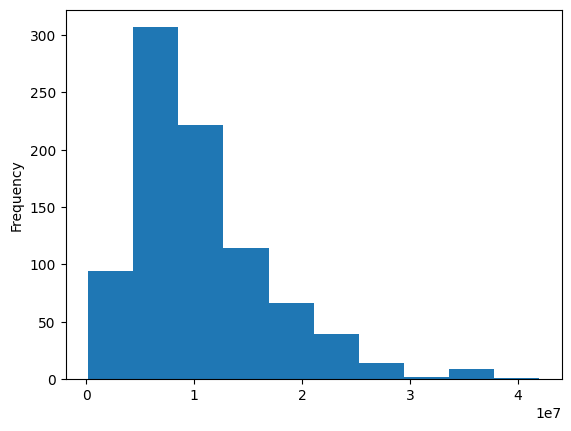

Mean: 10608800.755760368
std: 6404057.62021056
Median: 9082286.0


In [23]:
df_raw['proppant volume'].plot(kind='hist')
plt.show()
print(f"Mean: {df_raw['proppant volume'].mean()}\nstd: {df_raw['proppant volume'].std()}\nMedian: {df_raw['proppant volume'].median()}")

In this column we can see outliers away from the mean value, the apply the median to fill na values

In [24]:
df_processed['proppant volume'].fillna(df_processed['proppant volume'].median(), inplace=True)

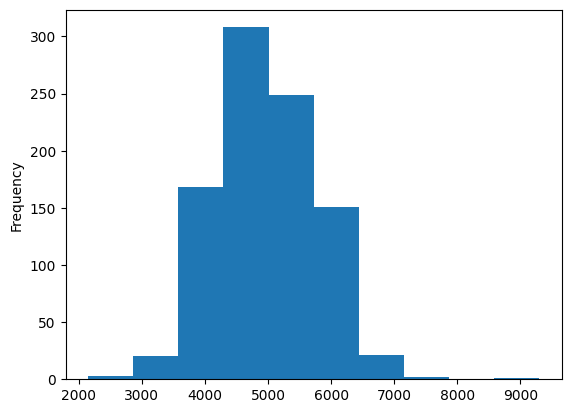

Mean: 4965.485373781148
std: 778.3997660759261
Median: 4927.0


In [25]:
df_raw['isip'].plot(kind='hist')
plt.show()
print(f"Mean: {df_raw['isip'].mean()}\nstd: {df_raw['isip'].std()}\nMedian: {df_raw['isip'].median()}")

In this case this feature looks like a normal distribution, we'll use median to impute missing values too

In [26]:
df_processed['isip'].fillna(df_processed['isip'].median(), inplace=True)

Let's loof k for 'porosity'

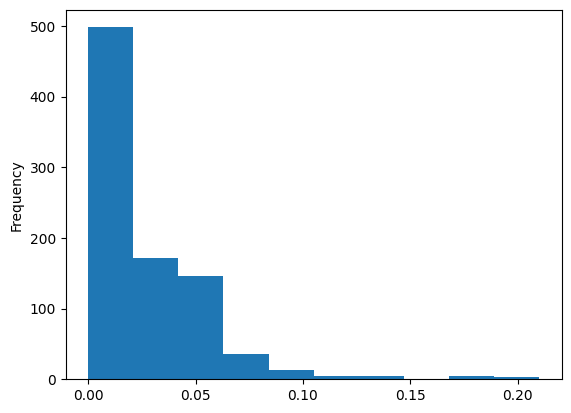

Mean: 0.03233825198637912
std: 0.02575635845828919
Median: 0.02


In [27]:
df_raw['porosity'].plot(kind='hist')
plt.show()
print(f"Mean: {df_raw['porosity'].mean()}\nstd: {df_raw['porosity'].std()}\nMedian: {df_raw['porosity'].median()}")

There's values away from the mean, we'll use median to impute missing values these method is not affected to outliers

In [28]:
df_processed['porosity'].fillna(df_processed['porosity'].median(), inplace=True)

The columns that still have missing values we'll use median to impute them, now

In [29]:
describe = df_processed.describe().T.reset_index()

columns_na = []
for i in range(len(describe)):
    if describe['count'][i] < 1000:
        df_processed[describe['index'][i]].fillna(df_processed[describe['index'][i]].median(), inplace=True)

### Linear correlation

Now that we're done dealing with missing values, let's look for linear correlation between columns

In [30]:
df_processed['year on production'] = df_raw['date on production'].apply(lambda x: x.year)
df_processed['month on production'] = df_raw['date on production'].apply(lambda x: x.month)
df_processed.drop('date on production', axis=1, inplace=True)

/tmp/ipykernel_837/2306245281.py:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_processed.corr(),


<AxesSubplot: >

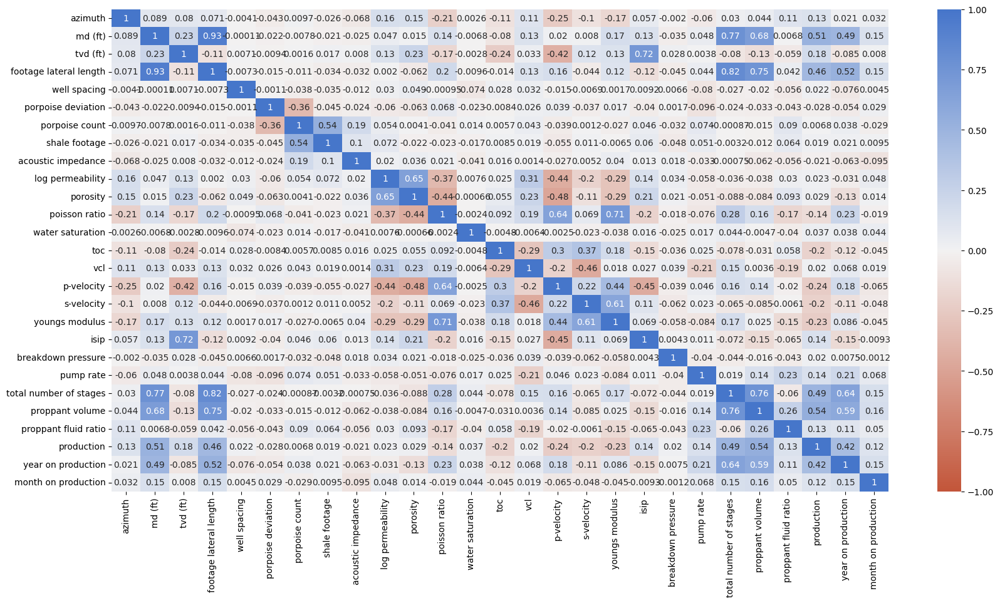

In [31]:
plt.figure(figsize=(20, 10))
sns.heatmap(
    df_processed.corr(), 
    annot=True, 
    center=0,
    vmin=-1,
    vmax=1,
    cmap=sns.diverging_palette(20, 255, as_cmap=True)
    )

The greatest insight in this plot is the strong correlation betweem 'footage lateral length' and 'md (ft)' whith a value of 0.93, then i proceed to drop 'footage lateral length' column is the less correlated with production

In [32]:
df_processed.drop('footage lateral length', axis=1, inplace=True)

The treatment company is important in production?
First let's see how many works does each one

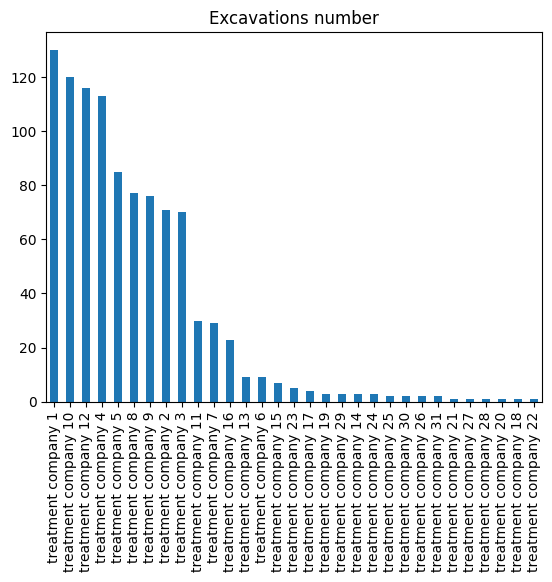

In [33]:
df_processed['treatment company'].value_counts().plot(kind='bar')
plt.title("Excavations number")
plt.show()

It's clear that are few companies with the most excavations, but how effective are?

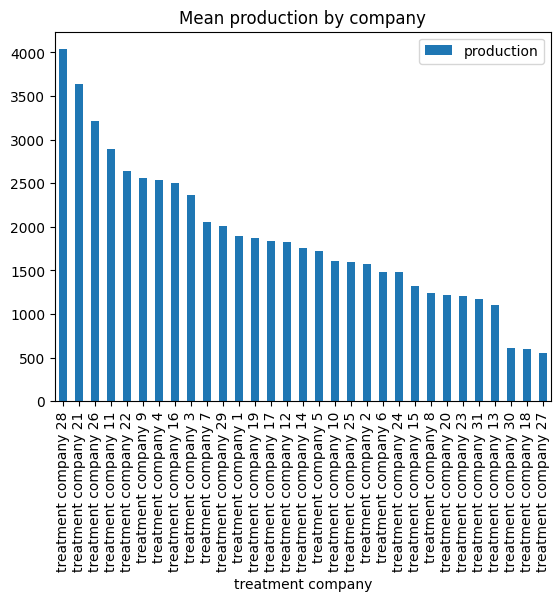

In [34]:
{
df_processed.groupby(['treatment company'])[['production']].mean()
.sort_values(by='production', ascending=False)
.plot(kind='bar')
}
plt.title("Mean production by company")
plt.show()

The amount of works isn't proportional to the mean production in excavations, therefore we'll dispense with columns related with companies

In [35]:
df_processed.drop(['treatment company', 'operator'], axis=1, inplace=True)

As last step i'll use pairplots to do a glance in the distribution of remaining variables

In [ ]:
rem_cols = df_raw.describe().T.reset_index()

df_rem = pd.DataFrame()
for i in range(len(rem_cols)):
    if rem_cols['count'][i] == 1000:
        df_rem[rem_cols['index']] = df_processed[rem_cols['index']]

df_rem.head()

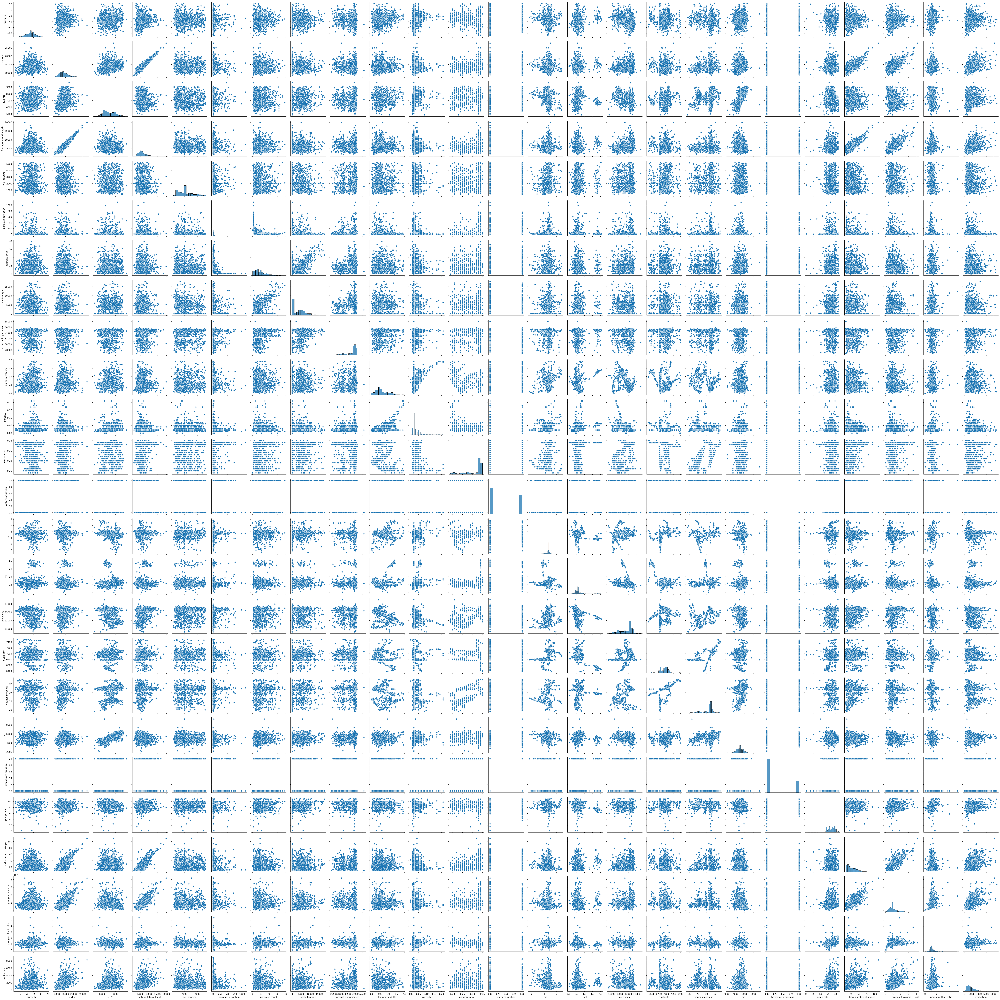

In [ ]:
# sns.pairplot(df_rem)

Looking in the variables distribution there's a tendency to positive asymmetry, this data will help to choose a scaler for the model. 